# Breast Cancer Prediction
This project analyzes the "Breast Cancer Wisconsin (Diagnostic) Data Set" to predict whether a tumor is malignant or benign. We apply manual feature selection to remove irrelevant columns, then train a XGBoost model to classify the tumors.

Given the critical importance of correctly identifying cancerous tumors, we focus on recall (also known as sensitivity) as the primary performance metric to minimize the number of false negatives.


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import warnings
warnings.filterwarnings('ignore', category=UserWarning)

!pip install boruta
from boruta import BorutaPy

In [ ]:
df = pd.read_csv('Breast Cancer Wisconsin (Diagnostic) Data Set.csv')
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

<Axes: >

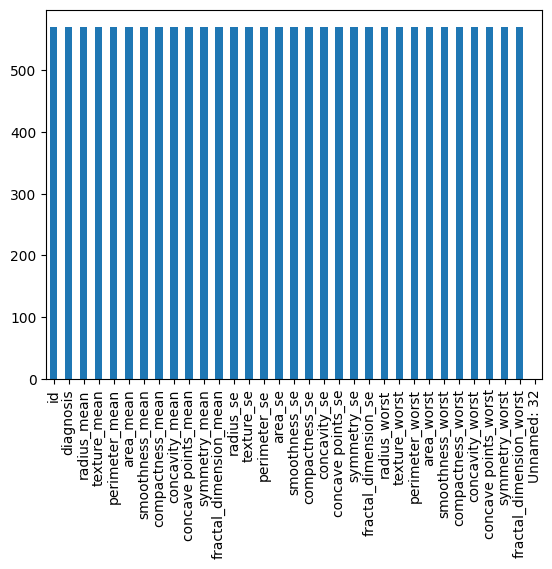

In [ ]:
# Check for missing data
print(df.isnull().sum())
df.count().plot(kind='bar')

In [ ]:
print(df.duplicated().sum())

0


In [ ]:
drop_list = ['Unnamed: 32', 'id']
df = df.drop(drop_list, axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [ ]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


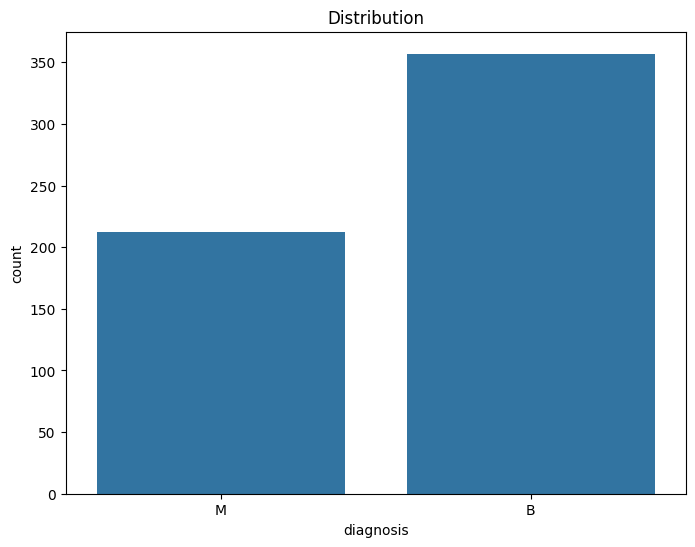

Benign: 357, Malignant: 212


In [ ]:
plt.figure(figsize=(8, 6))
sns.countplot(x='diagnosis', data=df)
plt.title('Distribution')
plt.show()

counts = df['diagnosis'].value_counts()
print(f'Benign: {counts["B"]}, Malignant: {counts["M"]}')

In [ ]:
df_target = df.diagnosis
df_features = df.drop('diagnosis', axis=1)
df_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   radius_mean              569 non-null    float64
 1   texture_mean             569 non-null    float64
 2   perimeter_mean           569 non-null    float64
 3   area_mean                569 non-null    float64
 4   smoothness_mean          569 non-null    float64
 5   compactness_mean         569 non-null    float64
 6   concavity_mean           569 non-null    float64
 7   concave points_mean      569 non-null    float64
 8   symmetry_mean            569 non-null    float64
 9   fractal_dimension_mean   569 non-null    float64
 10  radius_se                569 non-null    float64
 11  texture_se               569 non-null    float64
 12  perimeter_se             569 non-null    float64
 13  area_se                  569 non-null    float64
 14  smoothness_se            5

Küçük bir veriseti olduğu için Swarm plot kullanalım. Swarm plot her bir veriyi tek tek yerleştirdiği için küçük verisetlerinde çok iyi bir seçenek ama büyük verisetlerinde bir grafik çizmek bile çok uzun sürer.

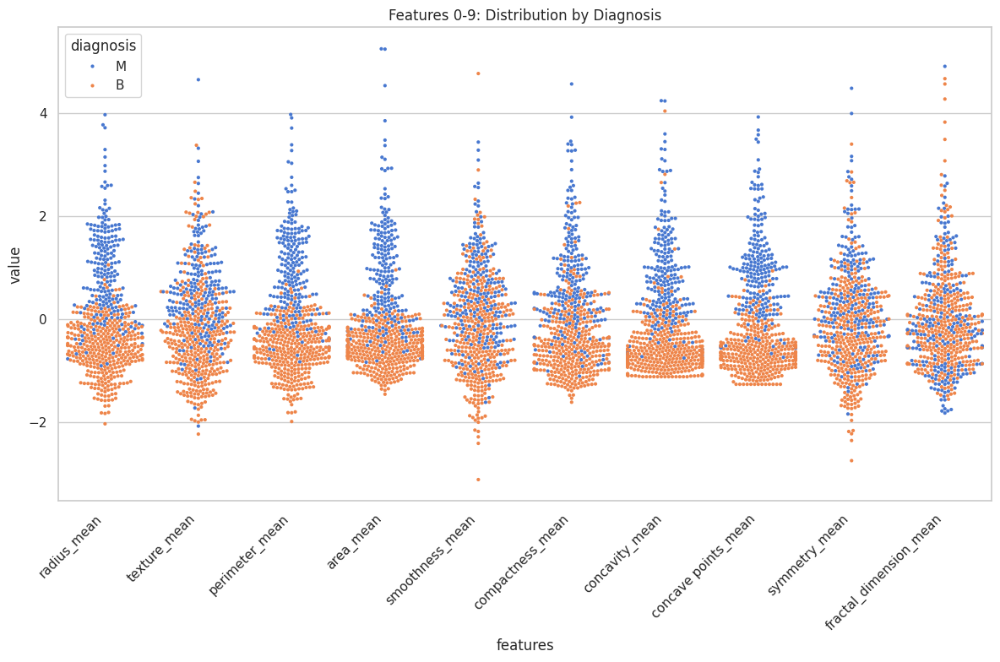

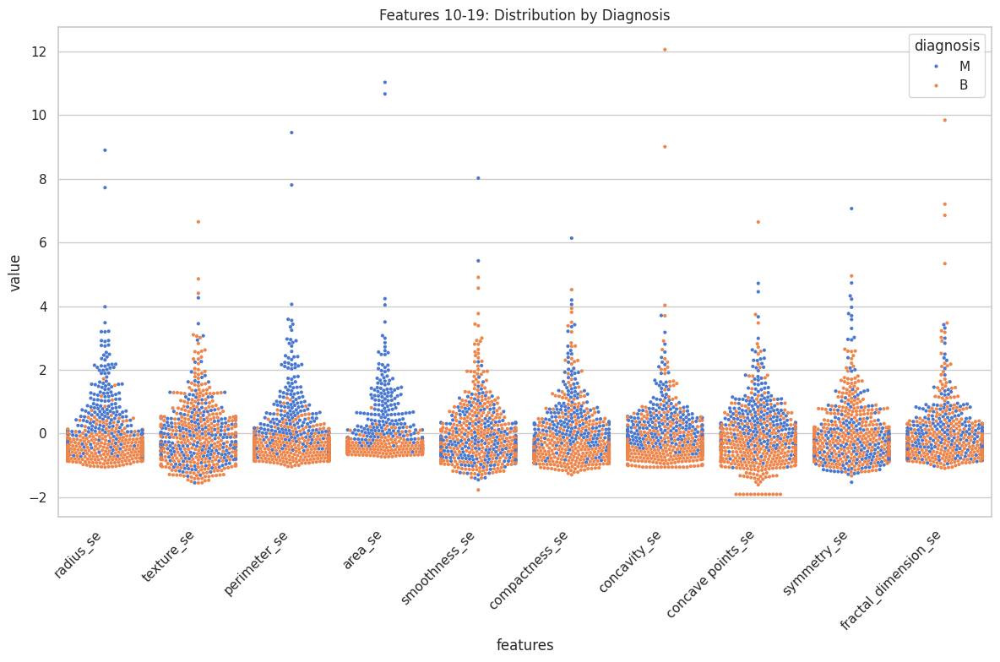

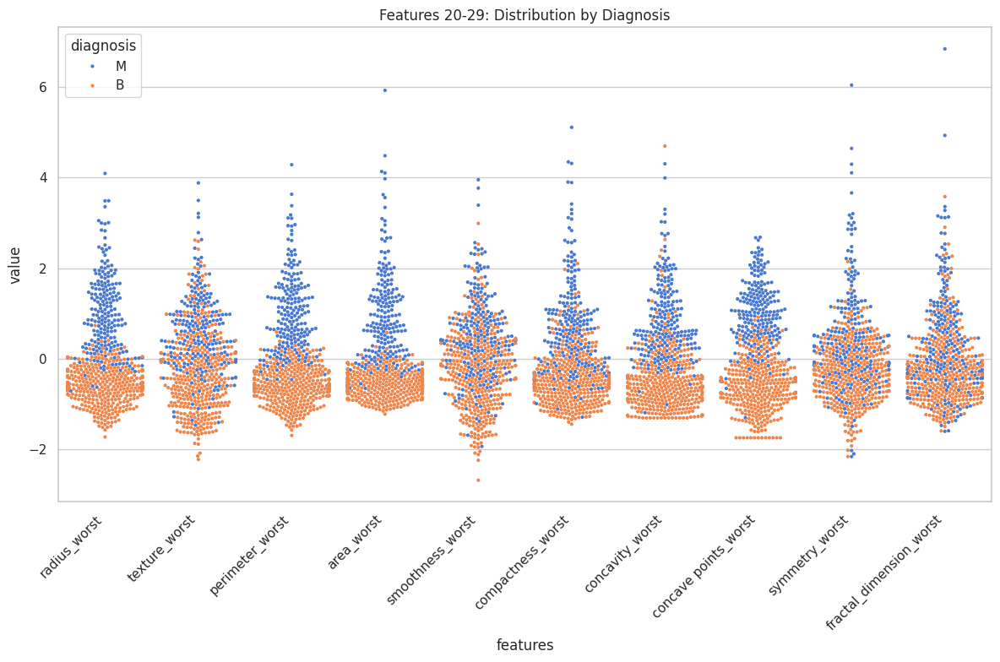

In [ ]:
# Swarm Plot
sns.set(style="whitegrid", palette="muted")

# Standardization
data_standardized = (df_features - df_features.mean()) / df_features.std()

# Total number of features
total_features = df_features.shape[1]
features_per_plot = 10

# Number of plots needed
num_plots = (total_features + features_per_plot - 1) // features_per_plot

# Create subplots for each group of features
for i in range(num_plots):
    start_idx = i * features_per_plot
    end_idx = min((i + 1) * features_per_plot, total_features)

    # Current batch of features
    current_features = data_standardized.iloc[:, start_idx:end_idx]
    data = pd.concat([df_target, current_features], axis=1)

    # Melt operation
    data_melted = pd.melt(data,
                         id_vars="diagnosis",
                         var_name="features",
                         value_name='value')

    # Swarmplot
    plt.figure(figsize=(12, 8))
    sns.swarmplot(data=data_melted,
                  x="features",
                  y="value",
                  hue="diagnosis",
                  size=3)

    plt.xticks(rotation=45, ha='right')
    plt.title(f'Features {start_idx}-{end_idx-1}: Distribution by Diagnosis')
    plt.tight_layout()
    plt.show()

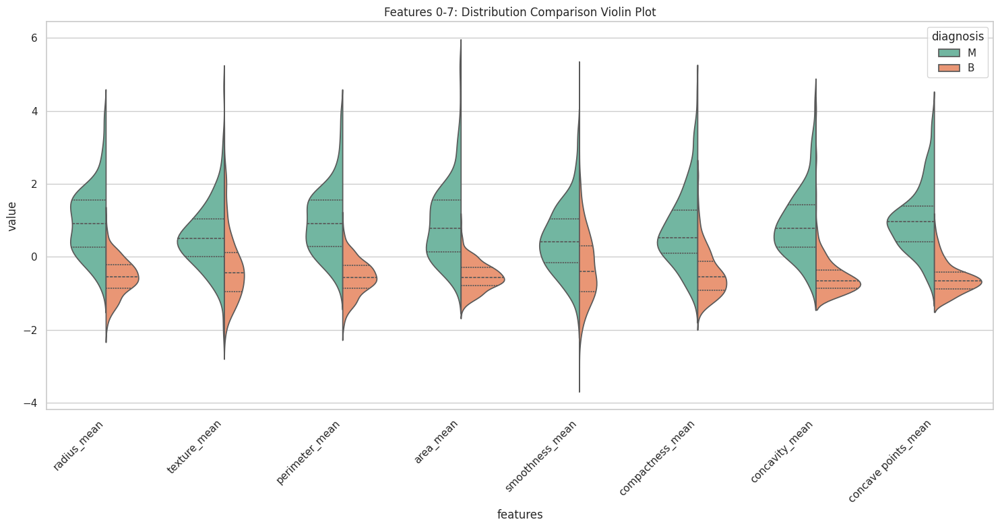

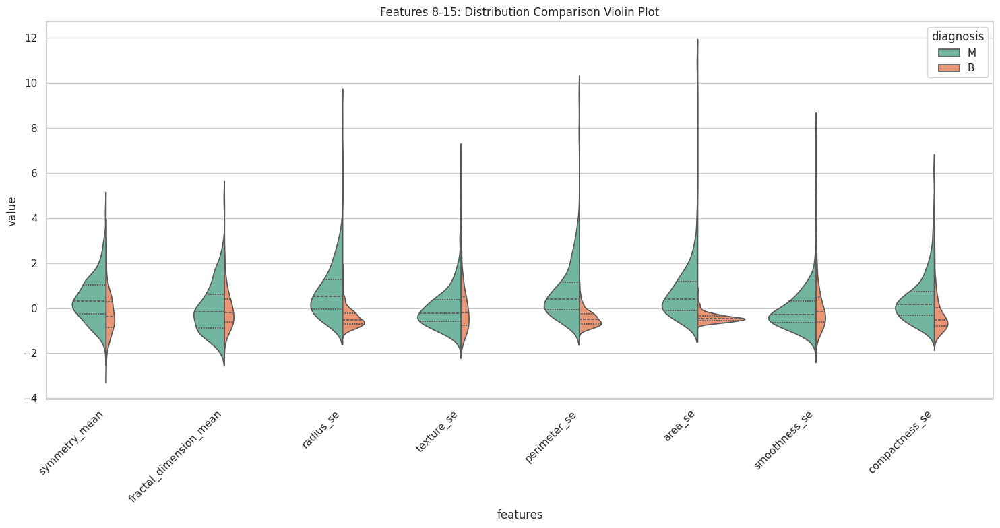

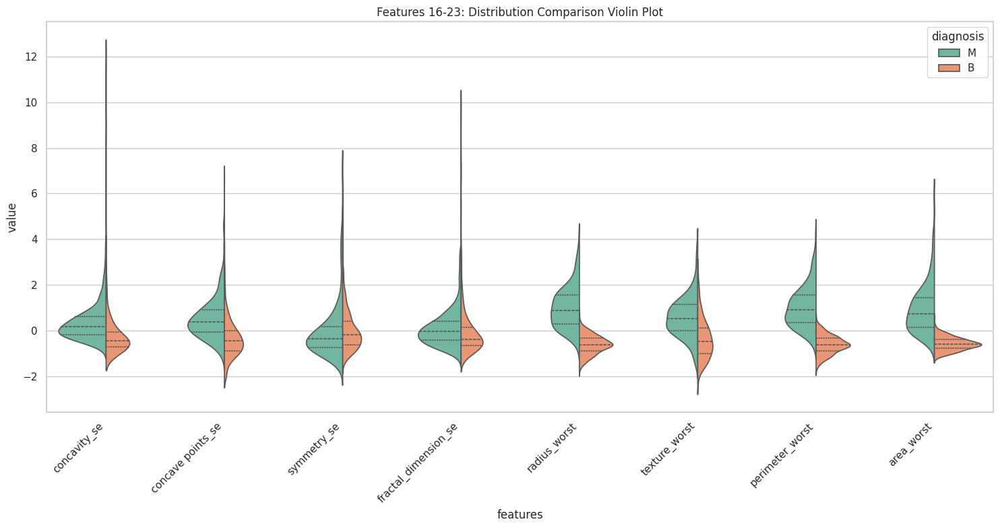

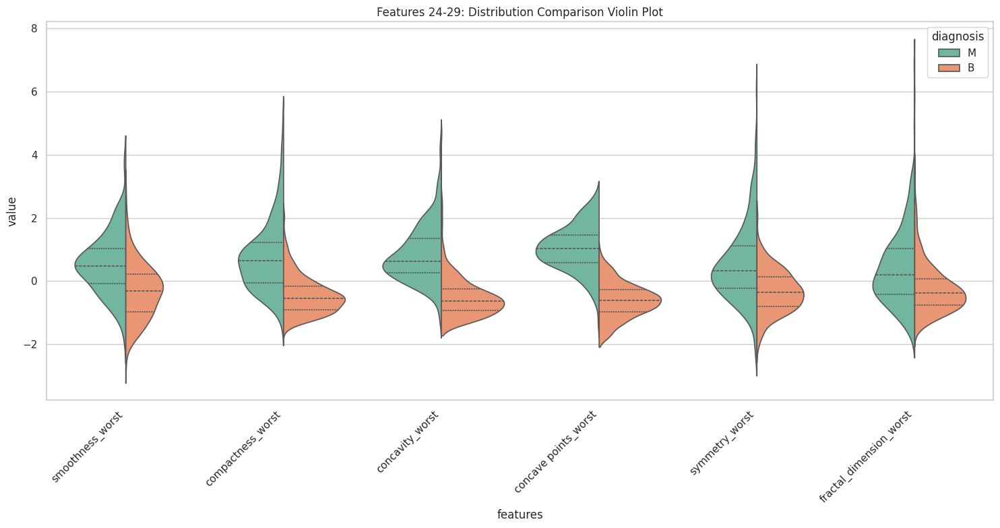

In [ ]:
sns.set(style="whitegrid", palette="muted")

# Standardization
data_standardized = (df_features - df_features.mean()) / df_features.std()

# Total number of features
total_features = df_features.shape[1]
features_per_plot = 8

# Number of plots needed
num_plots = (total_features + features_per_plot - 1) // features_per_plot

# Create subplots for each group of features
for i in range(num_plots):
    start_idx = i * features_per_plot
    end_idx = min((i + 1) * features_per_plot, total_features)

    # Current batch of features
    current_features = data_standardized.iloc[:, start_idx:end_idx]
    combined_data = pd.concat([df_target, current_features], axis=1)

    # Melting
    melted_data = pd.melt(combined_data,
                         id_vars="diagnosis",
                         var_name="features",
                         value_name='value')

    # Graph
    plt.figure(figsize=(15, 8))
    sns.violinplot(data=melted_data,
                   x="features",
                   y="value",
                   hue="diagnosis",
                   split=True,        # Split to categories
                   inner="quart",     # Show quart
                   palette="Set2")    # Nice color palatte

    plt.xticks(rotation=45, ha='right')
    plt.title(f'Features {start_idx}-{end_idx-1}: Distribution Comparison Violin Plot')
    plt.tight_layout()
    plt.show()

In [ ]:
drop_list = ['smoothness_mean','fractal_dimension_mean', 'texture_mean',
             'compactness_mean', 'texture_se', 'smoothness_se', 'symmetry_se',
             'compactness_se', 'fractal_dimension_se', 'smoothness_worst',
             'fractal_dimension_worst', 'symmetry_mean', 'concave points_se',
             'texture_worst', 'symmetry_worst']

df_features.drop(drop_list, axis=1, inplace=True)

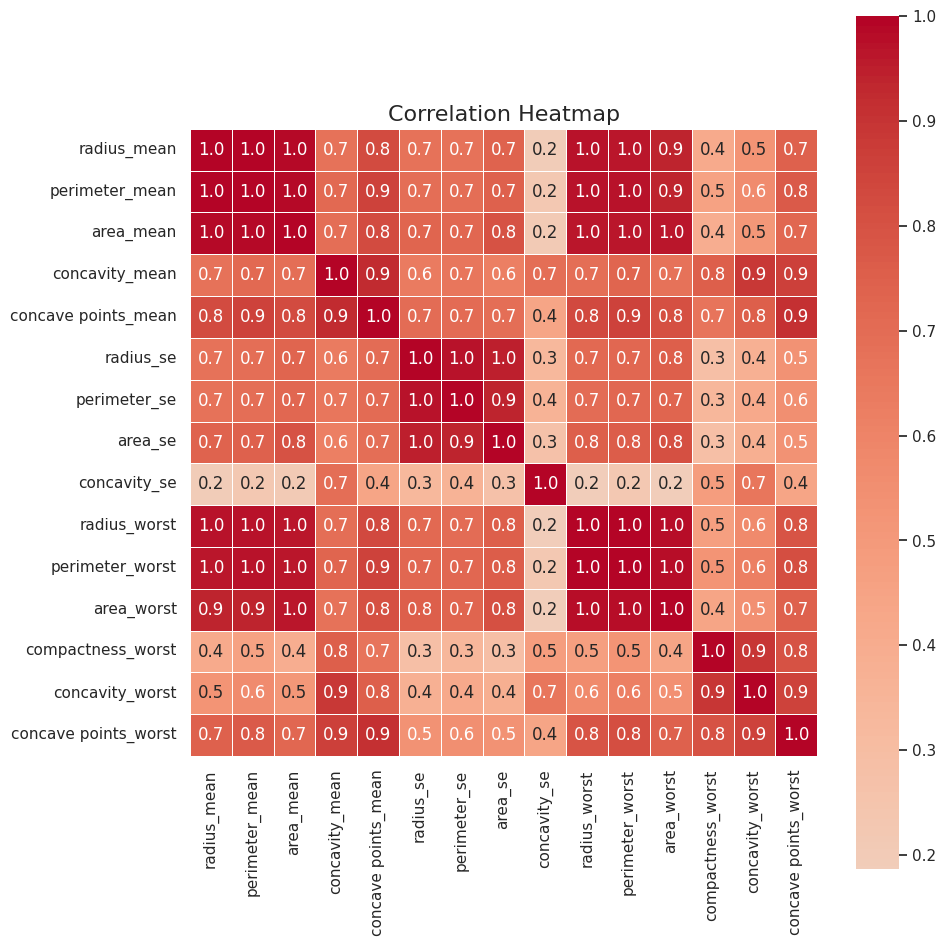

In [ ]:
# Correlation HeatMap
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(df_features.corr(),
            annot=True,          # Hücrede sayı değeri
            linewidths=.5,       # Hücre sınır kalınlığı
            fmt='.1f',           # Sayı kaç basamaklı 1f => 0.7 ve 2f => 0.68
            ax=ax,               # Fig boyutuyla alakalı görsellik için
            cmap='coolwarm',     # Renk paleti
            center=0,            # Renk skalası için şart
            square=True)         # Kare hücreler daha estetik

plt.title('Correlation Heatmap', fontsize=16)
plt.tight_layout()
plt.show()

/usr/local/lib/python3.12/dist-packages/seaborn/axisgrid.py:1696: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f = plt.figure(figsize=(height, height))


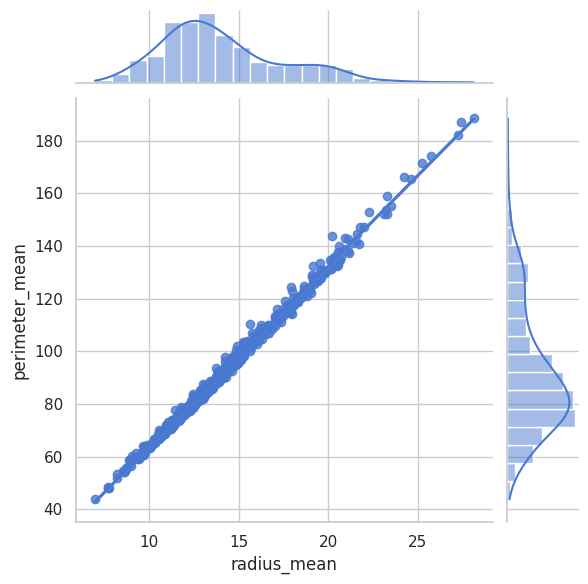

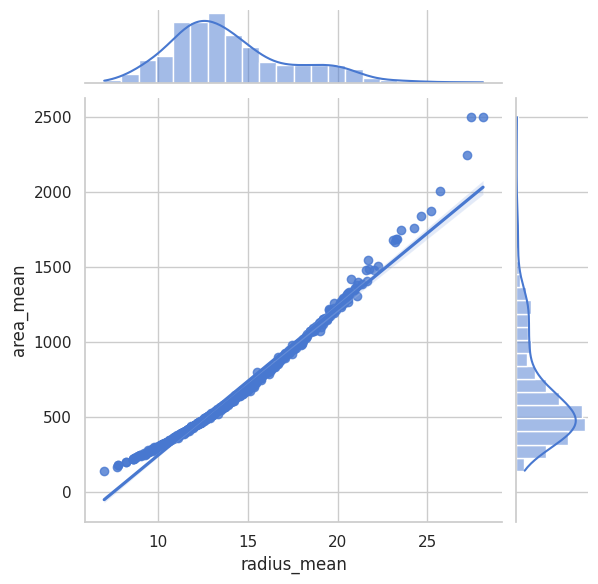

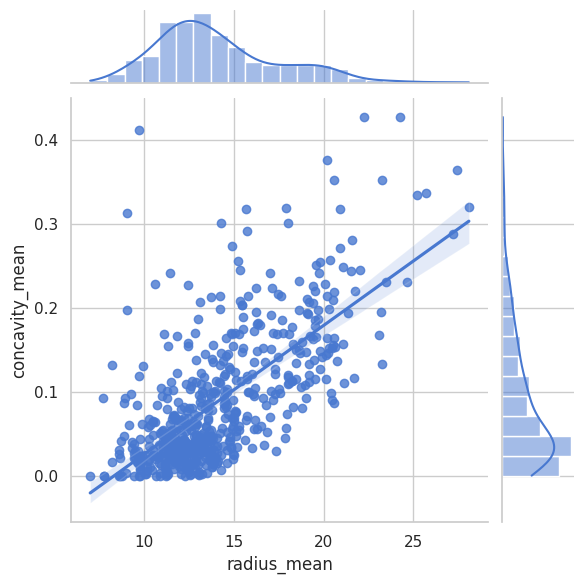

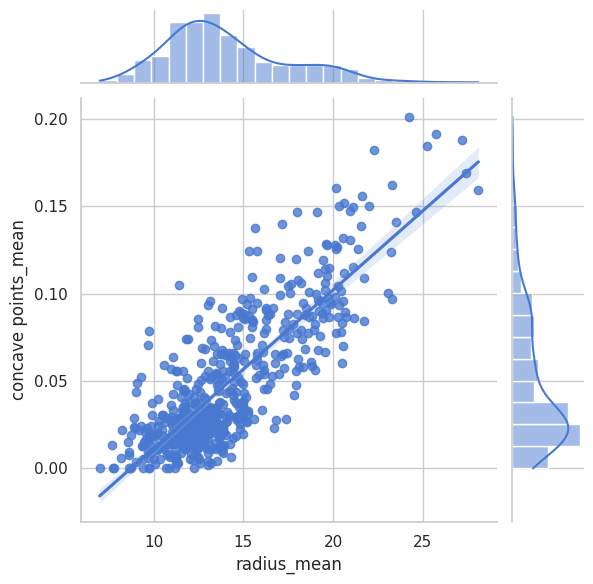

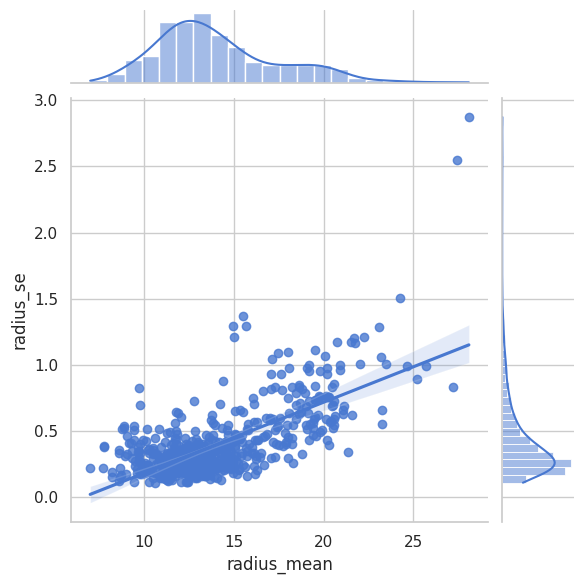

...

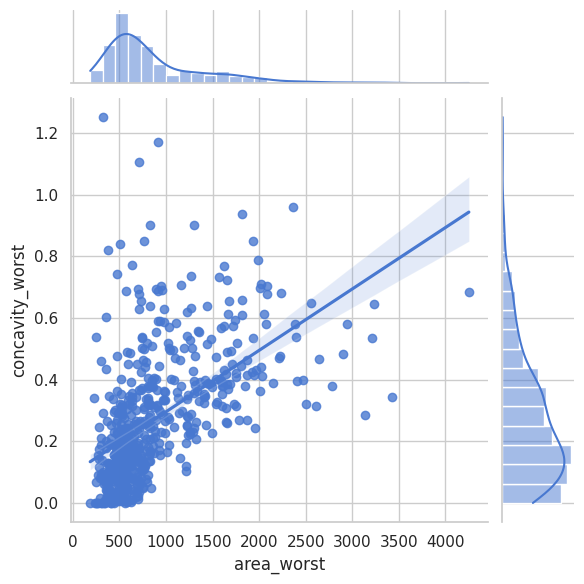

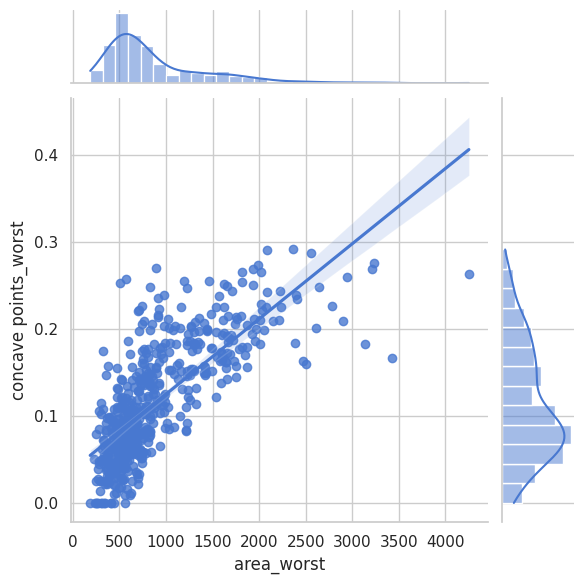

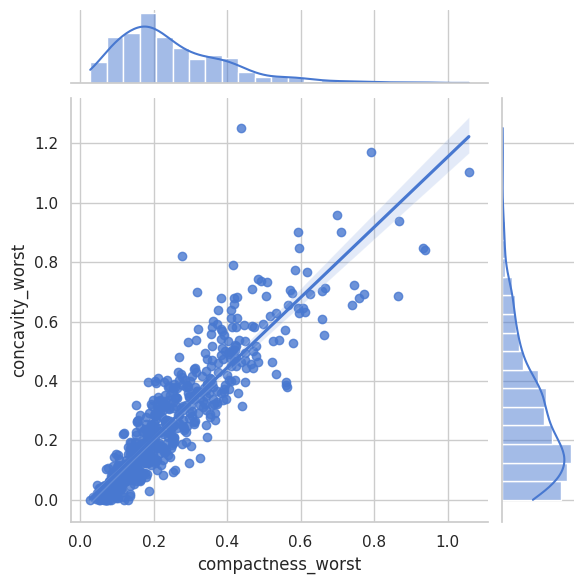

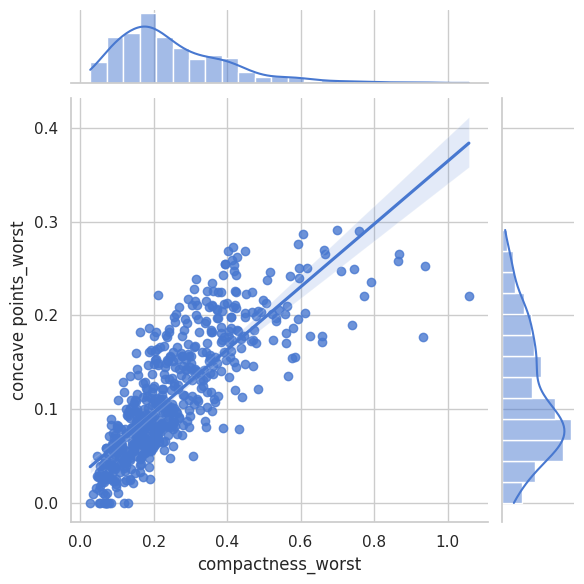

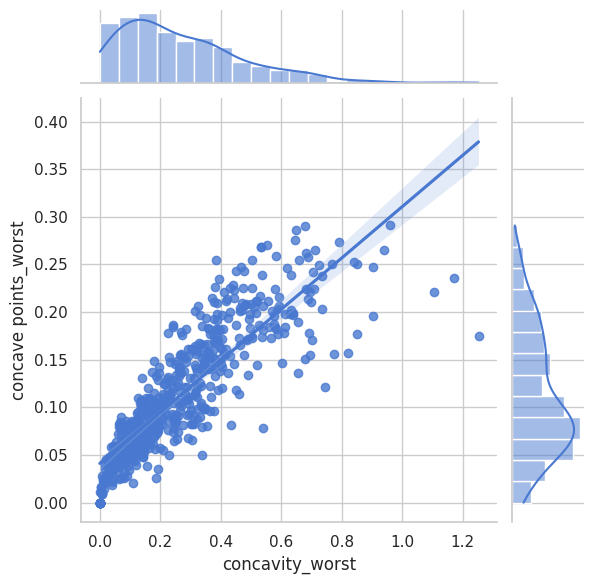

In [ ]:
from itertools import combinations
def plot_numerical_jointplots(df, kind="reg"):

    # Select only numerical columns
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

    # Create jointplots for all pairs of numerical features
    for col1, col2 in combinations(numerical_cols, 2):
        sns.jointplot(x=col1, y=col2, data=df, kind=kind)

plot_numerical_jointplots(df_features, kind="reg")

In [ ]:
drop_list = ['perimeter_mean', 'area_mean', 'perimeter_worst', 'area_worst',
             'perimeter_se', 'area_se', 'concavity_mean', 'concavity_worst',
             'radius_worst', 'concave points_mean']

df_features.drop(drop_list, axis=1, inplace=True)

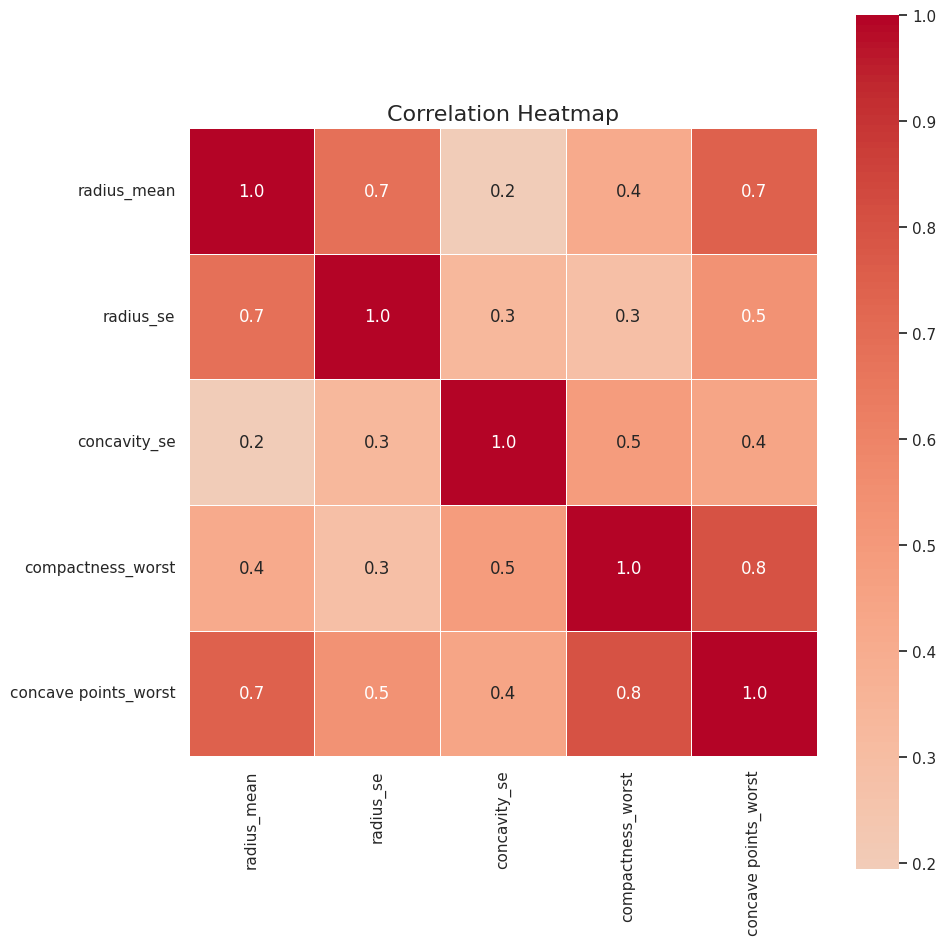

In [ ]:
# Correlation HeatMap
f, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(df_features.corr(),
            annot=True,          # Hücrede sayı değeri
            linewidths=.5,       # Hücre sınır kalınlığı
            fmt='.1f',           # Sayı kaç basamaklı 1f => 0.7 ve 2f => 0.68
            ax=ax,               # Fig boyutuyla alakalı görsellik için
            cmap='coolwarm',     # Renk paleti
            center=0,            # Renk skalası için şart
            square=True)         # Kare hücreler daha estetik

plt.title('Correlation Heatmap', fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
df_features.describe()

,radius_mean,radius_se,concavity_se,compactness_worst,concave points_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,0.405172,0.031894,0.254265,0.114606
std,3.524049,0.277313,0.030186,0.157336,0.065732
min,6.981000,0.111500,0.000000,0.027290,0.000000
25%,11.700000,0.232400,0.015090,0.147200,0.064930
50%,13.370000,0.324200,0.025890,0.211900,0.099930
75%,15.780000,0.478900,0.042050,0.339100,0.161400
max,28.110000,2.873000,0.396000,1.058000,0.291000


In [ ]:
# Standart Scaler
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_features_scaled = scaler.fit_transform(df_features)
df_features_scaled = pd.DataFrame(df_features_scaled, columns=df_features.columns)

In [ ]:
# Binary Encoding for Diagnosis
df_target = df_target.map({'B': 1, 'M': 0})

In [ ]:
from sklearn.model_selection import train_test_split

# Train (%60), Validation (%20) ve Test (%20)
X_train, X_temp, y_train, y_temp = train_test_split(df_features_scaled, df_target, test_size=0.4, random_state=42, stratify=df_target)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

# After optimization, we won't need validation set so we add it bak to train set
X_train_full = pd.concat([X_train, X_val])
y_train_full = pd.concat([y_train, y_val])

In [ ]:
!pip install xgboost
!pip install optuna

from xgboost import XGBClassifier
import optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.9/400.9 kB 4.5 MB/s eta 0:00:00


In [ ]:
from sklearn.metrics import (recall_score,precision_score,f1_score,
                             accuracy_score,roc_auc_score,classification_report)

In [ ]:
# We will need scale_pos_weight to balance dataset while training with XBGoost and Catboost
scale_pos_weight = y_train.value_counts()[0] / y_train.value_counts()[1]
print(f"scale_pos_weight value: {scale_pos_weight:.2f}")

scale_pos_weight value: 0.59


In [ ]:
# XGBoost - roc_auc

def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 2000),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'random_state': 42,
        'n_jobs': -1,
        'scale_pos_weight': scale_pos_weight,   # IMPORTANT
        'early_stopping_rounds': 50,
    }

    clf = XGBClassifier(**params)
    clf.fit(X_train, y_train,
            eval_set=[(X_val, y_val)],
            verbose=False)

    y_val_proba = clf.predict_proba(X_val)[:, 1]
    val_roc_auc = roc_auc_score(y_val, y_val_proba)
    return val_roc_auc

# ROC AUC optimization
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=1000, show_progress_bar=True)

print("\nOptimization Complete")
print("Best Trial:")
best_trial = study.best_trial
print(f"  Value (Validation ROC AUC): {best_trial.value:.4f}")
print("  Best hiperparameters: ")
for key, value in best_trial.params.items():
    print(f"    {key}: {value}")

print("\n MODEL PERFORMANS ")
final_model = XGBClassifier(
    **best_trial.params,
    scale_pos_weight=scale_pos_weight,
    random_state=42,
    n_jobs=-1
)
final_model.fit(X_train_full, y_train_full)

# Predict on Test Set
y_pred = final_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred))

[I 2025-09-28 00:03:06,587] A new study created in memory with name: no-name-4e139f62-f56c-4bea-8377-91665d6b5efd


  0%|          | 0/1000 [00:00<?, ?it/s]

[I 2025-09-28 00:03:06,768] Trial 0 finished with value: 0.9925595238095238 and parameters: {'n_estimators': 322, 'max_depth': 4, 'learning_rate': 0.026914536443761062, 'subsample': 0.9725465772515988, 'colsample_bytree': 0.8858359539801455, 'gamma': 2.6596398323859036}. Best is trial 0 with value: 0.9925595238095238.
[I 2025-09-28 00:03:06,825] Trial 1 finished with value: 0.9907407407407408 and parameters: {'n_estimators': 1277, 'max_depth': 4, 'learning_rate': 0.12994248722888885, 'subsample': 0.6155534329070259, 'colsample_bytree': 0.7707850201615688, 'gamma': 4.183195024613528}. Best is trial 0 with value: 0.9925595238095238.
[I 2025-09-28 00:03:07,222] Trial 2 finished with value: 0.9914021164021164 and parameters: {'n_estimators': 935, 'max_depth': 3, 'learning_rate': 0.011286583187310812, 'subsample': 0.7455220166057248, 'colsample_bytree': 0.7679941369375863, 'gamma': 2.454359272856615}. Best is trial 0 with value: 0.9925595238095238.
[I 2025-09-28 00:03:07,829] Trial 3 finish

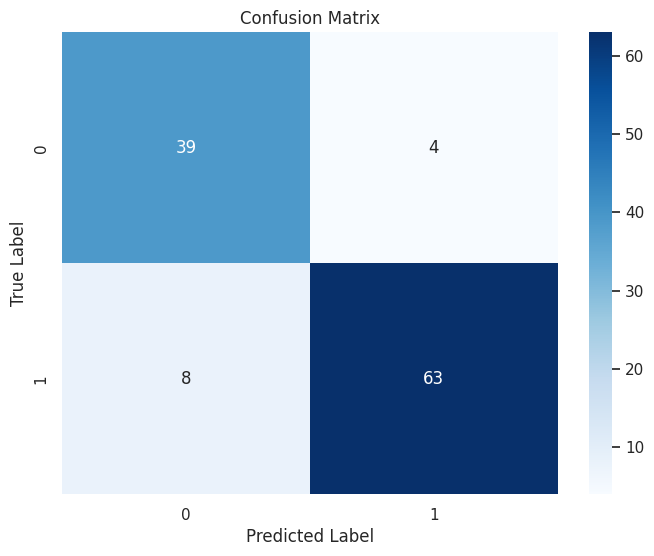


Confusion Matrix:
True Negatives: 39
False Positives: 4
False Negatives: 8
True Positives: 63


In [ ]:
# Confusion Matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

print(f"\nConfusion Matrix:")
print(f"True Negatives: {cm[0,0]}")
print(f"False Positives: {cm[0,1]}")
print(f"False Negatives: {cm[1,0]}")
print(f"True Positives: {cm[1,1]}")

In [ ]:
# XGBoost - custom scoring

def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 2000),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, log=True),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'random_state': 42,
        'n_jobs': -1,
        'scale_pos_weight': scale_pos_weight,   # IMPORTANT
        'early_stopping_rounds': 50,
    }

    clf = XGBClassifier(**params)
    clf.fit(X_train, y_train,
            eval_set=[(X_val, y_val)],
            verbose=False)

    # Weighted combination favoring churn recall
    y_val_pred = clf.predict(X_val)
    churn_recall = recall_score(y_val, y_val_pred, pos_label=1)
    precision_churn = precision_score(y_val, y_val_pred, pos_label=1)

    custom_score = 0.8 * churn_recall + 0.2 * precision_churn
    return custom_score

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=1000, show_progress_bar=True)

print("\nOptimization Complete")
print("Best Trial:")
best_trial = study.best_trial
print(f"  Value (Validation ROC AUC): {best_trial.value:.4f}")
print("  Best hiperparameters: ")
for key, value in best_trial.params.items():
    print(f"    {key}: {value}")

print("\n MODEL PERFORMANS ")
final_model = XGBClassifier(
    **best_trial.params,
    scale_pos_weight=scale_pos_weight,
    random_state=42,
    n_jobs=-1
)
final_model.fit(X_train_full, y_train_full)

# Predict on Test Set
y_pred = final_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print("\nClassification Report:\n", classification_report(y_test, y_pred))

[I 2025-09-28 00:05:02,199] A new study created in memory with name: no-name-676a0c15-ce37-4771-a394-eba4d2322731


  0%|          | 0/1000 [00:00<?, ?it/s]

[I 2025-09-28 00:05:02,350] Trial 0 finished with value: 0.9583333333333334 and parameters: {'n_estimators': 301, 'max_depth': 8, 'learning_rate': 0.011428361565927839, 'subsample': 0.9812689940478341, 'colsample_bytree': 0.7949052591365439, 'gamma': 0.8903099565722061}. Best is trial 0 with value: 0.9583333333333334.
[I 2025-09-28 00:05:02,427] Trial 1 finished with value: 0.9583333333333334 and parameters: {'n_estimators': 138, 'max_depth': 3, 'learning_rate': 0.26750180734230483, 'subsample': 0.6020353386276203, 'colsample_bytree': 0.8963797031245597, 'gamma': 0.535719878332791}. Best is trial 0 with value: 0.9583333333333334.
[I 2025-09-28 00:05:02,507] Trial 2 finished with value: 0.969558599695586 and parameters: {'n_estimators': 1770, 'max_depth': 10, 'learning_rate': 0.29076116413792913, 'subsample': 0.8672314393432977, 'colsample_bytree': 0.8333923071157333, 'gamma': 3.9754809591572537}. Best is trial 2 with value: 0.969558599695586.
[I 2025-09-28 00:05:02,703] Trial 3 finishe

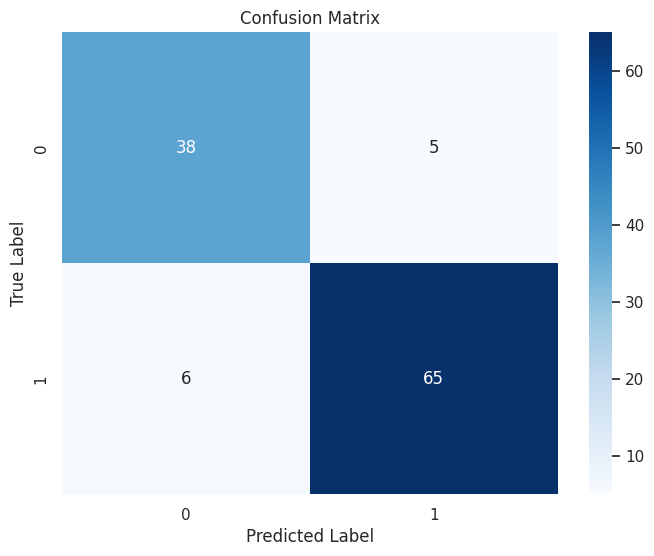


Confusion Matrix:
True Negatives: 38
False Positives: 5
False Negatives: 6
True Positives: 65


In [ ]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

print(f"\nConfusion Matrix:")
print(f"True Negatives: {cm[0,0]}")
print(f"False Positives: {cm[0,1]}")
print(f"False Negatives: {cm[1,0]}")
print(f"True Positives: {cm[1,1]}")